In [1]:
#importing required libraries and reading data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import geopandas as gpd
import scipy.stats as stats
import shapefile as shp
import plotly.express as px

df = pd.read_csv('Train.csv')

In [2]:
df.info()
display(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29451 entries, 0 to 29450
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   POSTED_BY              29451 non-null  object 
 1   UNDER_CONSTRUCTION     29451 non-null  int64  
 2   RERA                   29451 non-null  int64  
 3   BHK_NO.                29451 non-null  int64  
 4   BHK_OR_RK              29451 non-null  object 
 5   SQUARE_FT              29451 non-null  float64
 6   READY_TO_MOVE          29451 non-null  int64  
 7   RESALE                 29451 non-null  int64  
 8   ADDRESS                29451 non-null  object 
 9   LONGITUDE              29451 non-null  float64
 10  LATITUDE               29451 non-null  float64
 11  TARGET(PRICE_IN_LACS)  29451 non-null  float64
dtypes: float64(4), int64(5), object(3)
memory usage: 2.7+ MB


,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5
...,...,...,...,...,...,...,...,...,...,...,...,...
29446,Owner,0,0,3,BHK,2500.000000,1,1,"Shamshabad Road,Agra",27.140626,78.043277,45.0
29447,Owner,0,0,2,BHK,769.230769,1,1,"E3-108, Lake View Recidency,,Vapi",39.945409,-86.150721,16.0
29448,Dealer,0,0,2,BHK,1022.641509,1,1,"Ajmer Road,Jaipur",26.928785,75.828002,27.1
29449,Owner,0,0,2,BHK,927.079009,1,1,"Sholinganallur,Chennai",12.900150,80.227910,67.0


In [3]:
#splitting the ADDRESS column into two columns (Locality and City) using the division (,)

df['City'] = df['ADDRESS'].str.split(',').str.get(-1)
df['Locality'] = df['ADDRESS'].str.split(',').str.get(-2)

#creating a list of unique cities
cities = df['City'].unique()

#As we split the address, some of the localities come out as '' (because of two commas), 
#we change the index of the splitting to fix this
for i in range(df.shape[0]):
    if(df.iat[i,13]) == '' :
        df.iat[i,13] = df.iat[i,8].split(',')[-3]

#clubbing the data by city
df.sort_values('City' , inplace = True)
df.reset_index(drop = False)
# df = pd.get_dummies(df , columns = ['BHK_OR_RK'])

#dropping the redundant column address
df.drop('ADDRESS', axis = 1 , inplace=True)

In [4]:
#The localities of both of these cities (not really) are the same as that of mumbai, its better to replace both of these with mumbai
df['City'] = df.replace({'City' : {'Maharashtra' : 'Mumbai'}})['City']

#df['City'] = df.replace({'City' : {'Lalitpur' : 'Mumbai'}})['City']

print(df['City'].nunique())

255


In [5]:
#creating a new dataframe which contains total no. of localities (available data) for each city
city_locality_df=pd.DataFrame(columns =['City', 'Localities_no'], index = [x for x in range(254)])
i=0
for city in df['City'].unique():
    city_locality_df['City'][i]= city
    city_locality_df['Localities_no'][i]=len(df.loc[df['City']==city])
    i+=1

#we sort the dataframe in an ascending fashion to get the major cities on the top
city_locality_df=city_locality_df.sort_values(by="Localities_no", ascending=False)

display(city_locality_df)
major_cities=[]

#Creating a list of major cities (top 6)
for i in range(6):
    major_cities.append(city_locality_df.iloc[i,0])
    display(city_locality_df.iloc[i,:])

#we will now perform most of our EDAs on the top 6 major cities

,City,Localities_no
21,Bangalore,4340
148,Mumbai,3602
142,Lalitpur,2993
191,Pune,1991
171,Noida,1767
...,...,...
141,Kurukshetra,1
136,Korba,1
123,Kangra,1
115,Jhunjhunu,1


City             Bangalore
Localities_no         4340
Name: 21, dtype: object

City             Mumbai
Localities_no      3602
Name: 148, dtype: object

City             Lalitpur
Localities_no        2993
Name: 142, dtype: object

City             Pune
Localities_no    1991
Name: 191, dtype: object

City             Noida
Localities_no     1767
Name: 171, dtype: object

City             Kolkata
Localities_no       1709
Name: 134, dtype: object

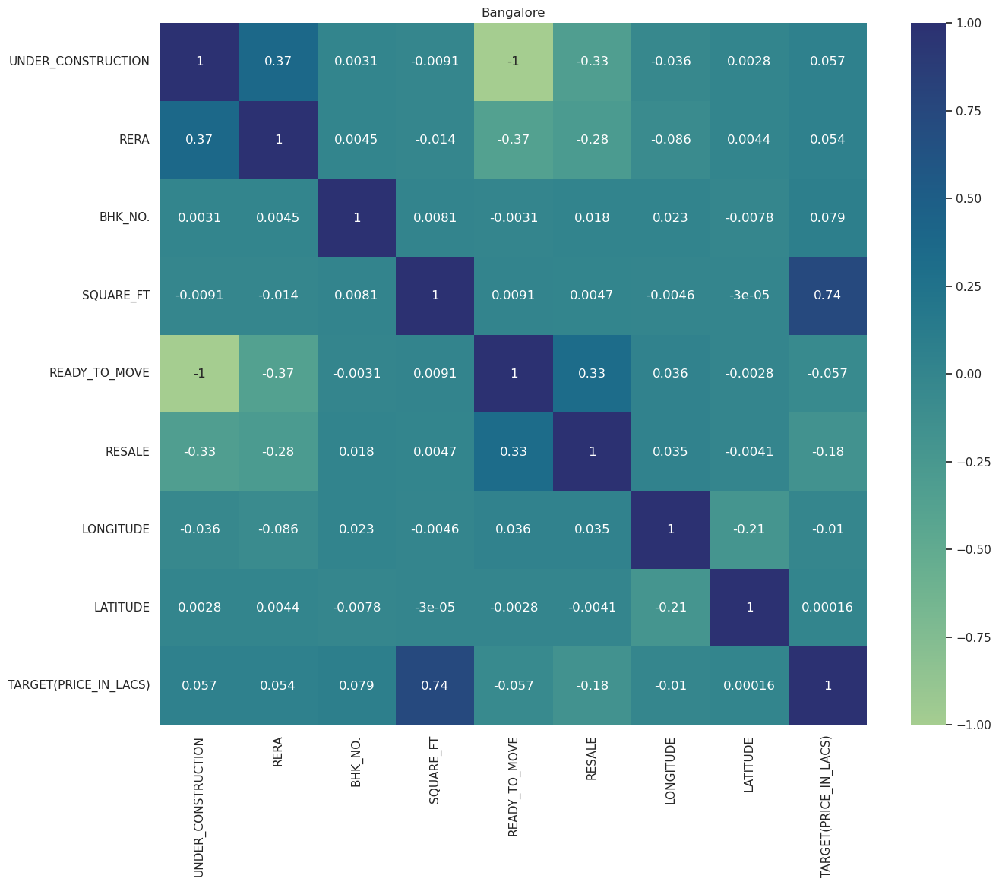

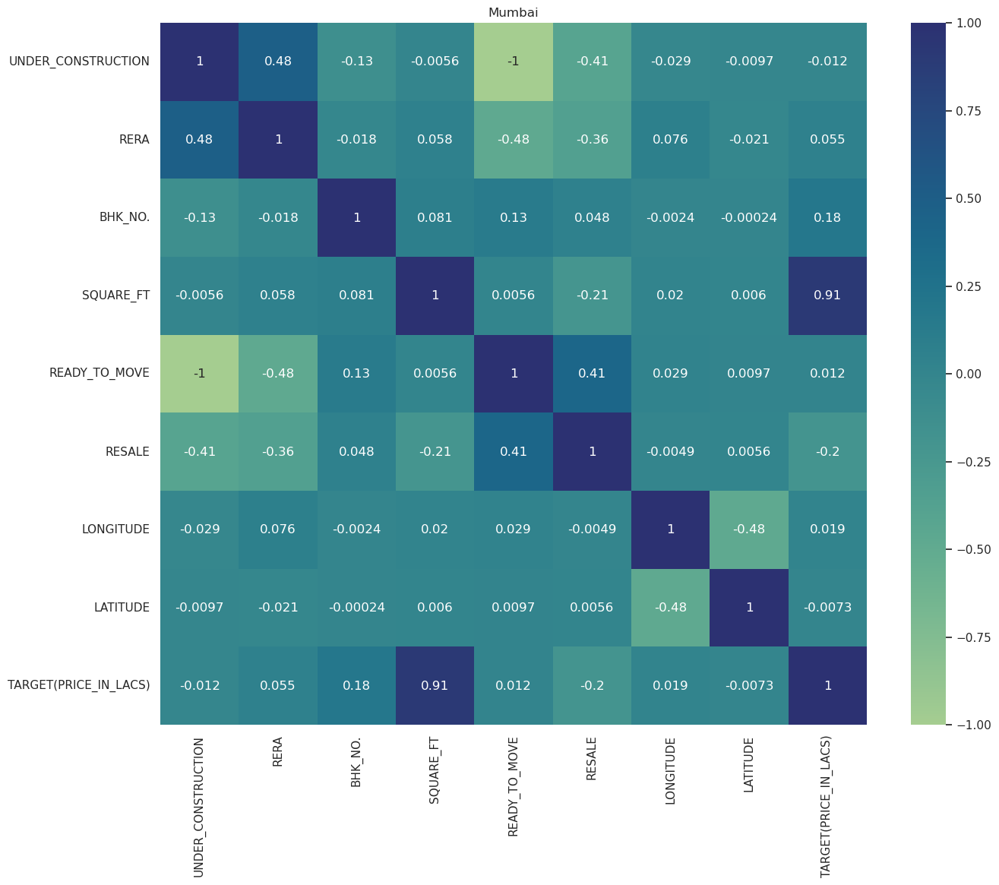

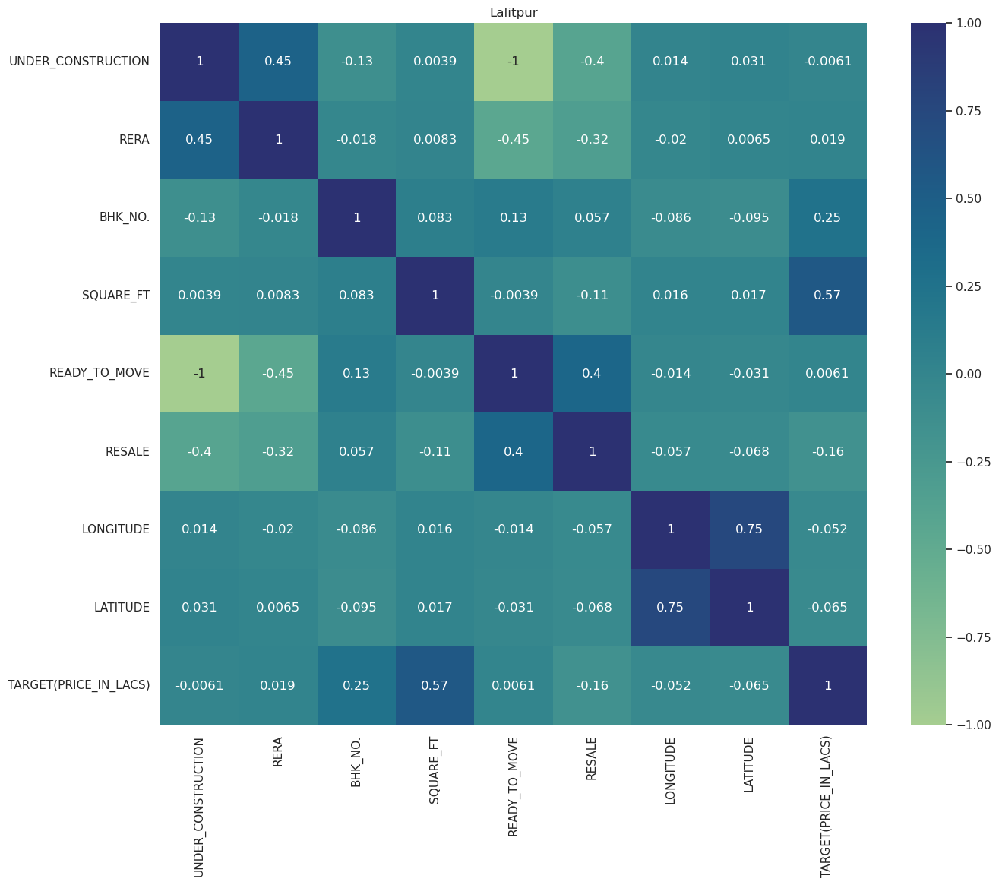

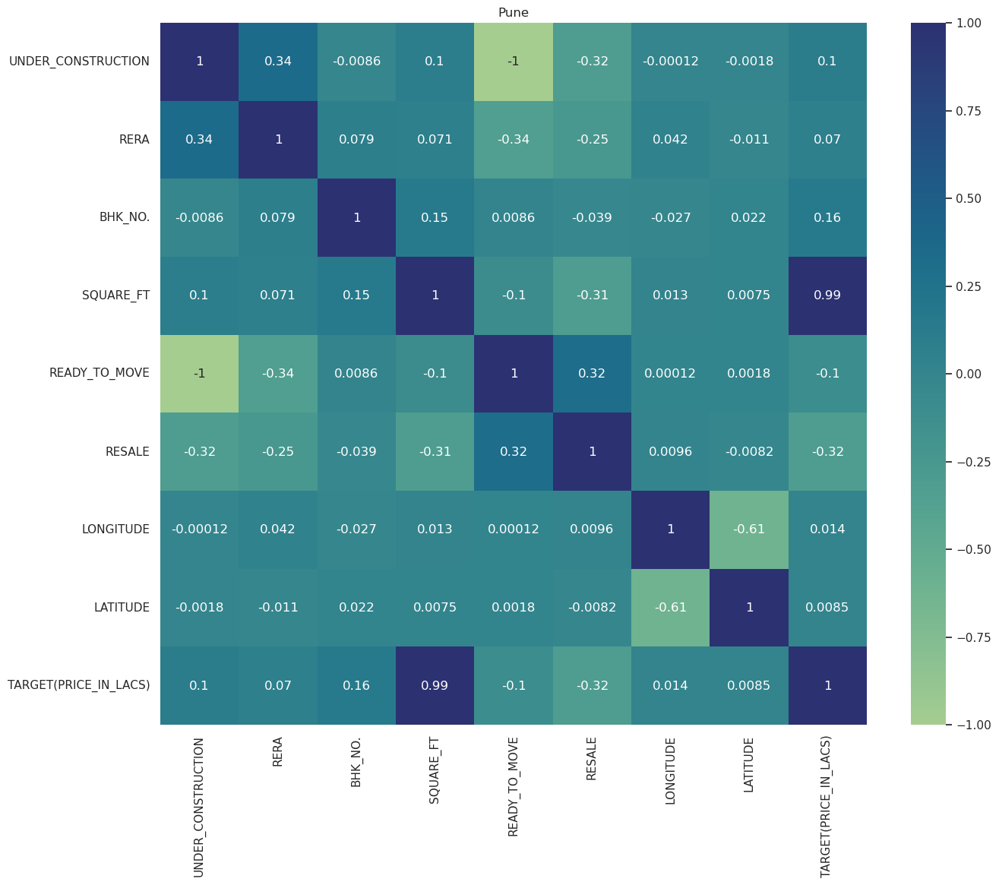

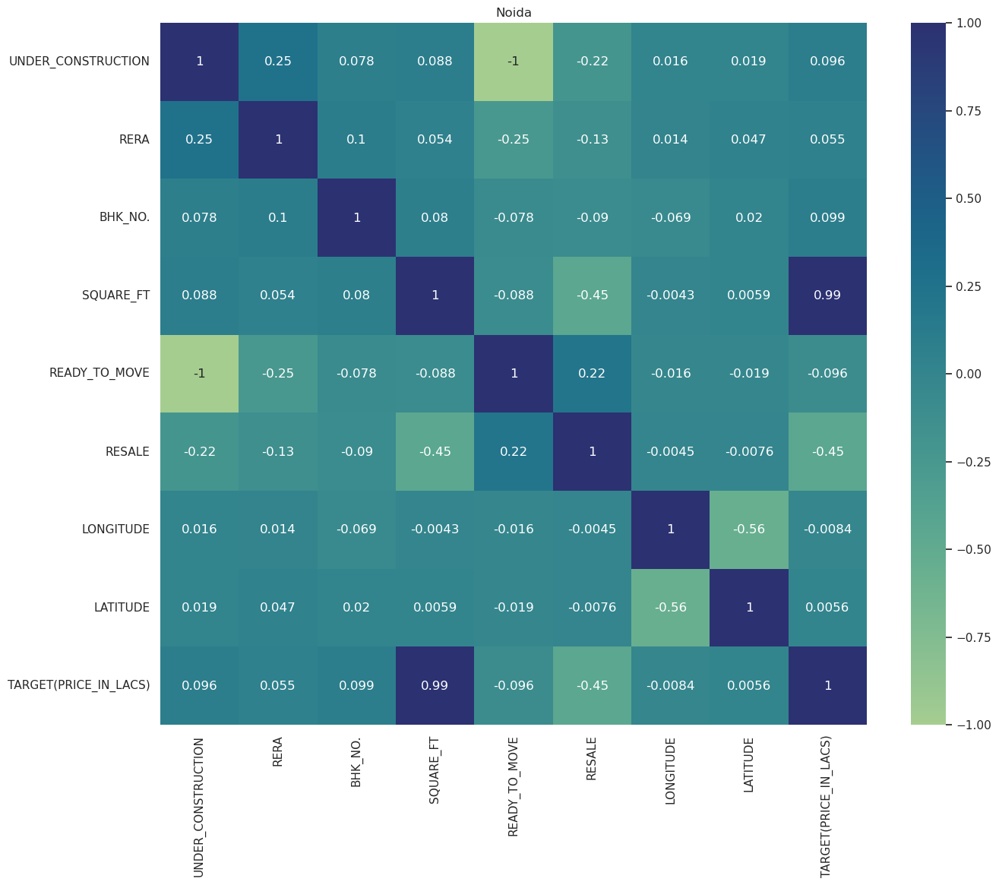

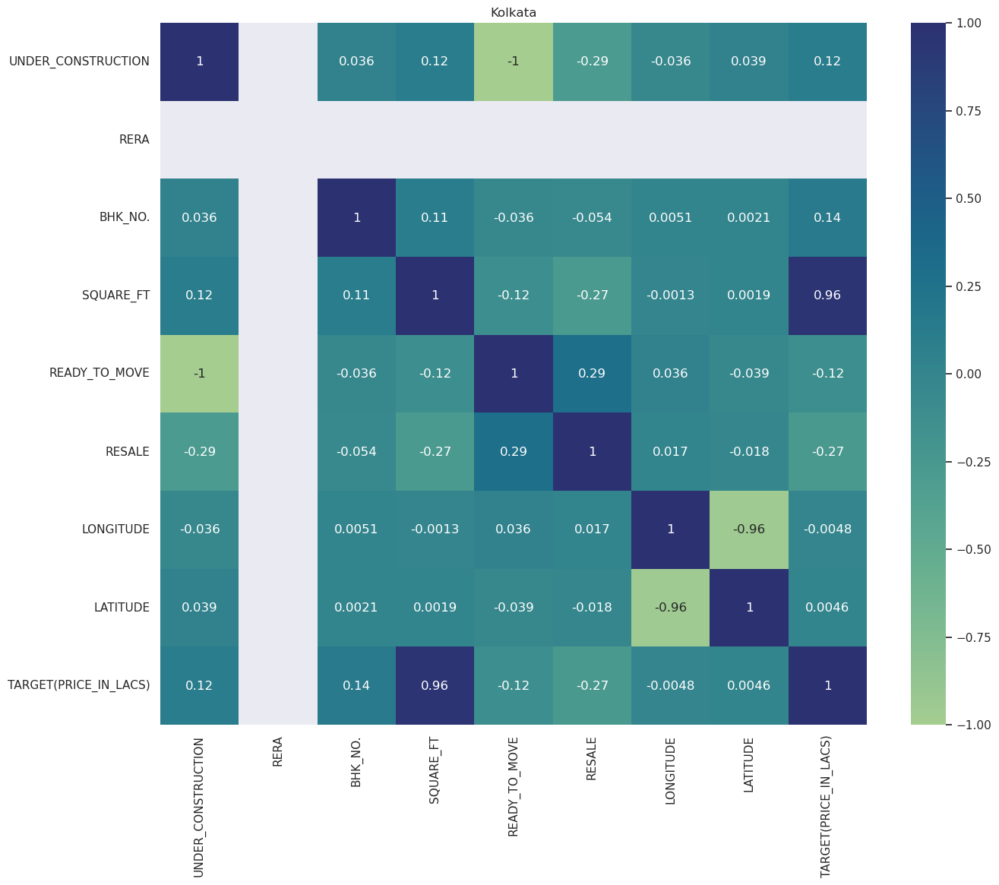

In [6]:
#plotting a heatmap to identify correlations between different variables
for city in major_cities:
    sb.set(rc = {'figure.figsize' : (15,12)})
    sb.heatmap(df.loc[df['City']==city].corr() , annot = True,cmap='crest')
    plt.title(city)
    plt.show()

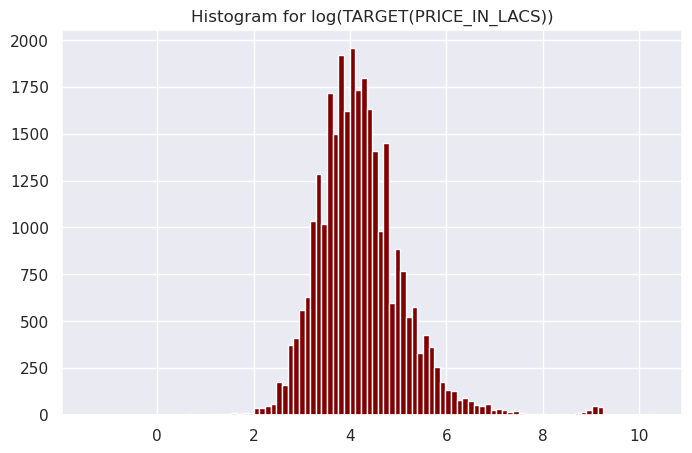

<AxesSubplot:title={'center':'Log Price Distribution'}, ylabel='Density'>

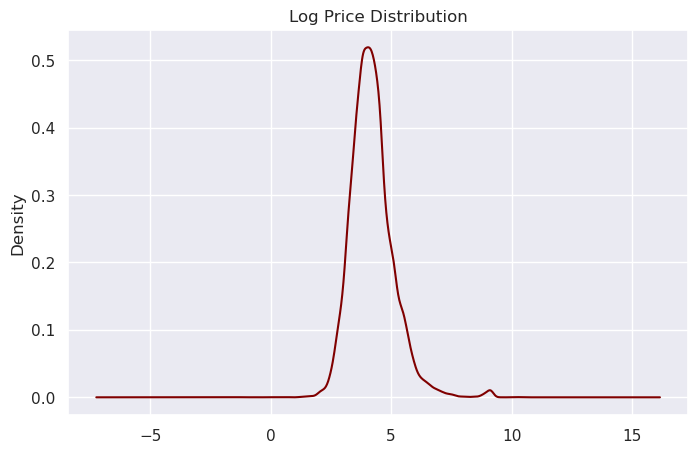

In [7]:
#plotting a histogram on the target (house prices)
df['Log_prices'] = np.log(df['TARGET(PRICE_IN_LACS)'])
f = plt.figure()
f.set_figwidth(8)
f.set_figheight(5)
plt.hist(df['Log_prices'], color='maroon',bins = 100)
plt.title('Histogram for log(TARGET(PRICE_IN_LACS))')
plt.show()

#plotting a continous log price distribution with density on the y axis
f = plt.figure()
f.set_figwidth(8)
f.set_figheight(5)
df['Log_prices'].plot(kind = 'density',color='maroon', title = 'Log Price Distribution')
#THESE PLOTS DO HELP US IDENTIFY THE OUTLIERS !!

In [8]:
#plotting a scatter plot using plotly :) for house prices (target) vs Bhk number
fig = px.scatter(df, x = 'BHK_NO.', y='TARGET(PRICE_IN_LACS)', hover_name = 'City',title="House Prices vs BHK no.")
fig.show()

#THESE PLOTS DO HELP US IDENTIFY THE OUTLIERS (PART 2) !!

In [9]:
#Removing the outliers by putting appropriate thresholds
df = df.loc[(df['TARGET(PRICE_IN_LACS)'] < 1000)]
df = df.loc[(df['BHK_NO.']  <  7)]

In [10]:
f = plt.figure()
f.set_figwidth(8)
f.set_figheight(5)
#we plot the graphs without the outliers
fig = px.scatter(df , x = 'BHK_NO.', y = 'TARGET(PRICE_IN_LACS)', hover_name = 'City', title='House Prices vs Bhk no.')
fig.show()

#plotting a scatter plot of lof of the house prices vs log of the area of the houses
df['log_sq_ft'] = np.log(df['SQUARE_FT'])
fig = px.scatter(df , x = 'log_sq_ft', y = 'Log_prices', hover_name = 'City', title=' Log Prices vs Log Area')
fig.show()

<Figure size 800x500 with 0 Axes>

In [11]:
#Plotting scatter plots of Area(sq.ft) vs Target (House Price) vs localities using plotly express for the top 6 major cities
for cities in major_cities:
    city = df.loc[df['City'] == cities]
    fig = px.scatter( city, x = 'Locality', color = 'TARGET(PRICE_IN_LACS)', size = 'SQUARE_FT', title = cities,width = 1500, height = 1000)
    fig.show()

In [12]:
#plotting pie charts of the BHK-No. distribution in each of the major cities

#listing the unique no. of BHK_NO. column in x
x=df['BHK_NO.'].unique()
for city in major_cities:
    #a list y which has the total no. data for each unique BHK_no. for a city
    y=[]
    
    #filling the list y with the required data (we use len as it gives the total no. of rows of the selected data)
    for bhk in df['BHK_NO.'].unique():
        y1=len(df.loc[df['City']==city].loc[df['BHK_NO.']==bhk])
        y.append(y1)
        
    #plotting the pie chart for each major city
    fig = px.pie( values = y , names = df['BHK_NO.'].unique() , title = city ,color_discrete_sequence=px.colors.sequential.RdBu )
    fig.show()
    

In [13]:
#Building a dataframe which contains the House price average for each BHK_no. in each city
Majcity_bhk = pd.DataFrame(columns = ['BHK_NO.','Target','City'], index = [x for x in range(5*df['BHK_NO.'].nunique())])

#i is a index
i=0
for city in major_cities:
    #creates a temporary dataframe which selects data for a city
    dfc=df.loc[df['City']==city]
    
    #looping around all of the BHK_NO. unique values to get average house prices for each in a prticular city
    for j in range(1,7):
        
        #filling the new dataframe Majcity_bhk
        Majcity_bhk.loc[i,'BHK_NO.']=j
        Majcity_bhk.loc[i,'City']=city
        
        #avoiding input of NaN in the new dataframe by using if else condition
        if (len(dfc.loc[dfc['BHK_NO.']==j]==0)):
            Majcity_bhk.loc[i,'Target']= (dfc.loc[dfc['BHK_NO.']==j,'TARGET(PRICE_IN_LACS)'].sum())/len(dfc.loc[dfc['BHK_NO.']==j])
        else:
            Majcity_bhk.loc[i,'Target']= 0
        i+=1
        
display(Majcity_bhk)

#plotting a multiple line graph for each city showing the average House prices (Target) for every unique BHK_NO. 
fig = px.line(Majcity_bhk, x='BHK_NO.', y='Target', color='City',title="Average BHK price in Major Cities" , markers = True)
fig.show()

,BHK_NO.,Target,City
0,1,43.202941,Bangalore
1,2,62.889498,Bangalore
2,3,119.839782,Bangalore
3,4,292.914498,Bangalore
4,5,426.538462,Bangalore
5,6,600.0,Bangalore
6,1,65.528642,Mumbai
7,2,136.38368,Mumbai
8,3,263.168034,Mumbai
9,4,529.586207,Mumbai


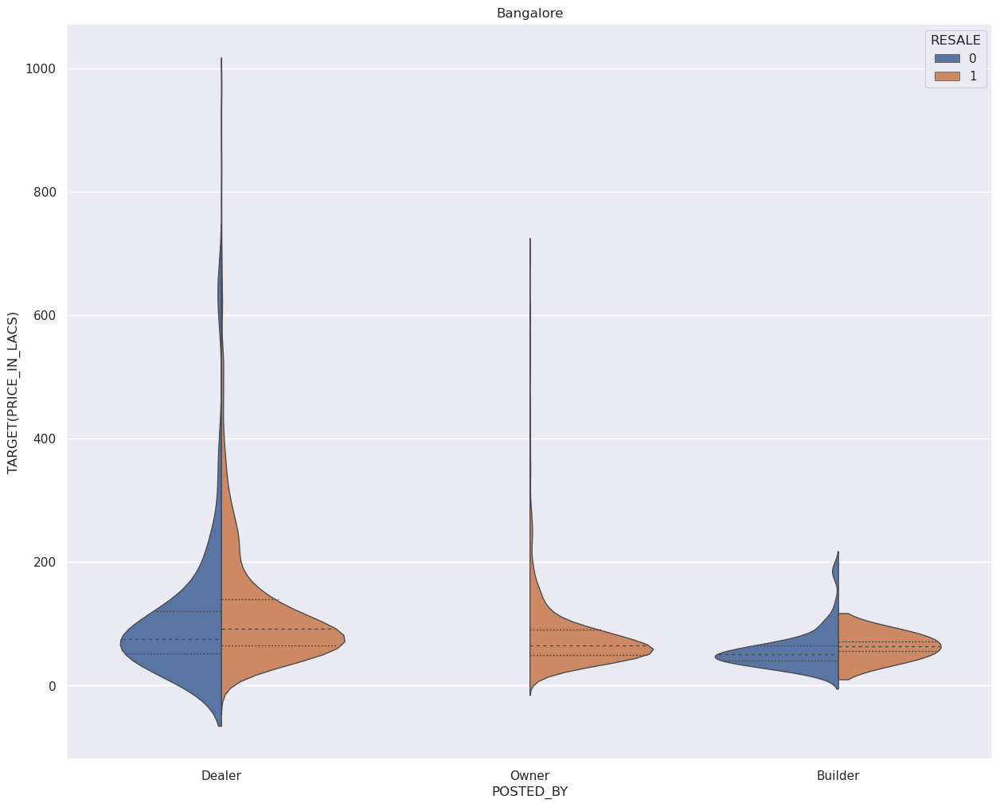

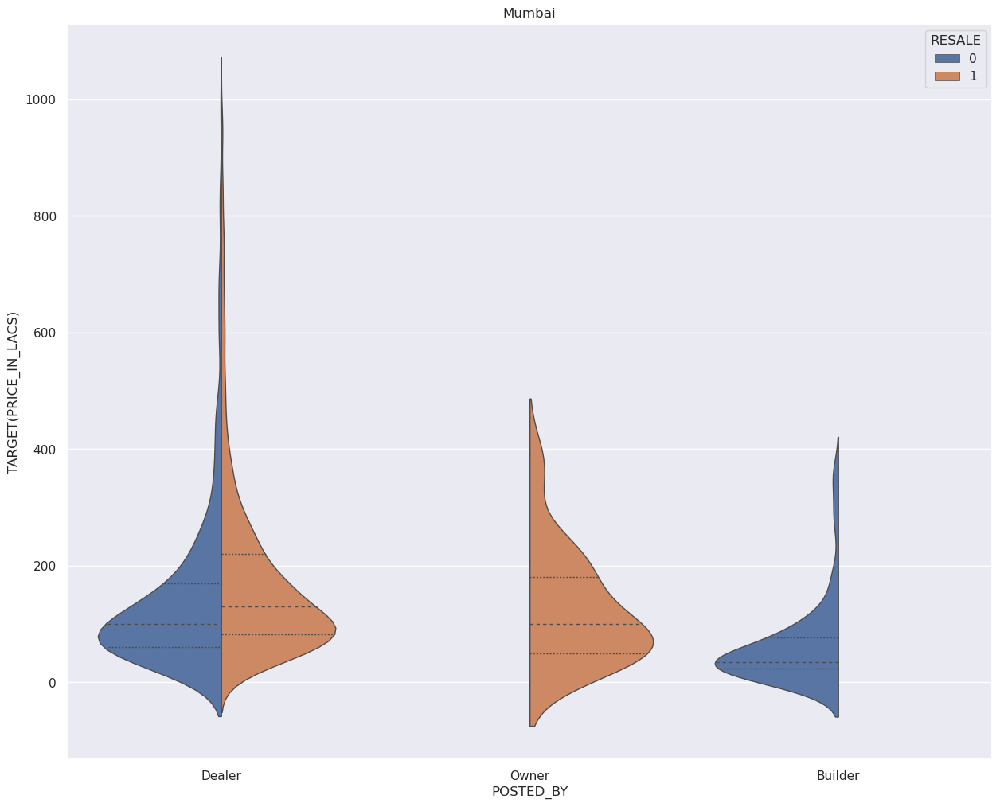

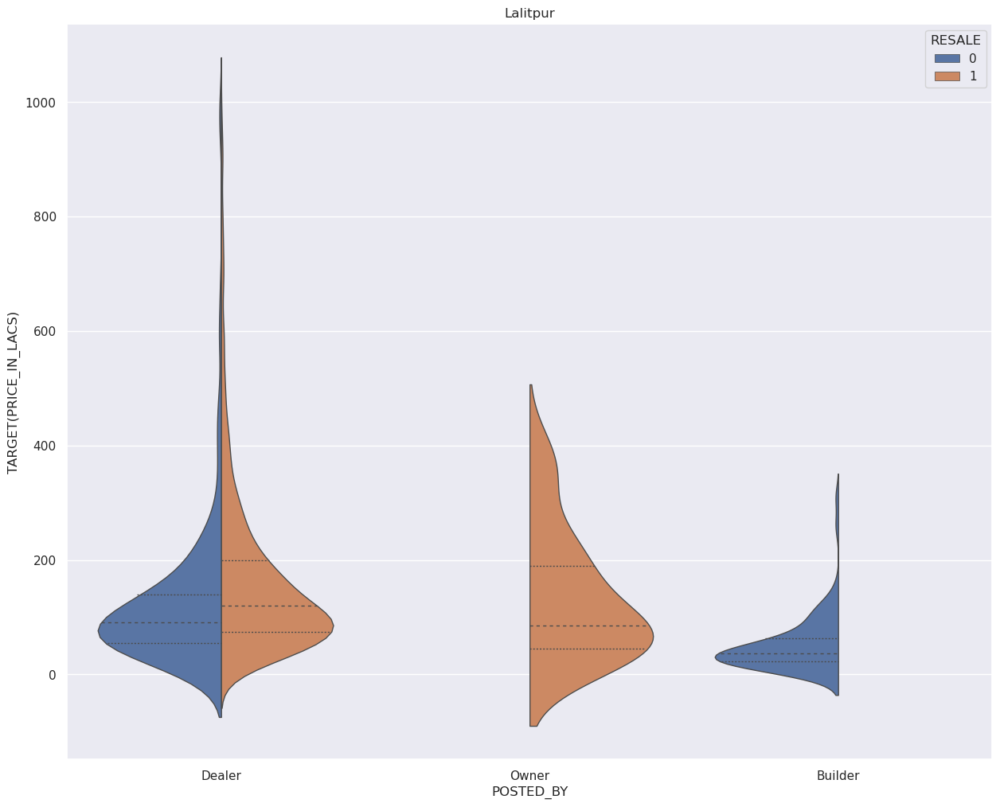

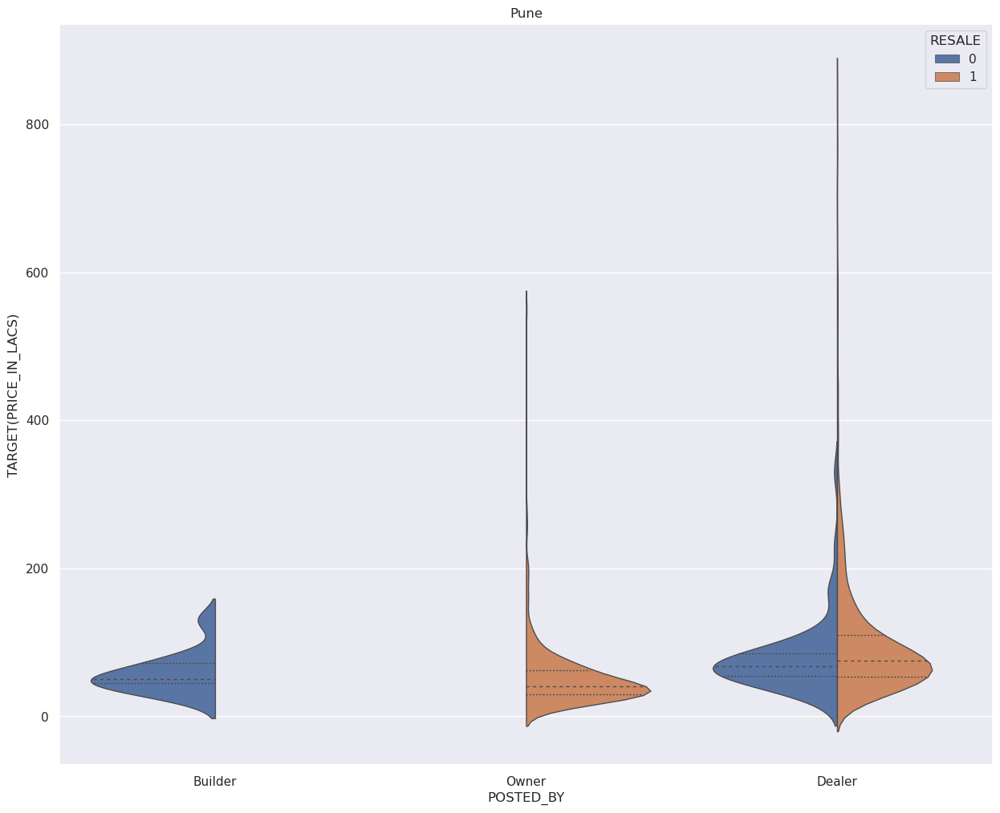

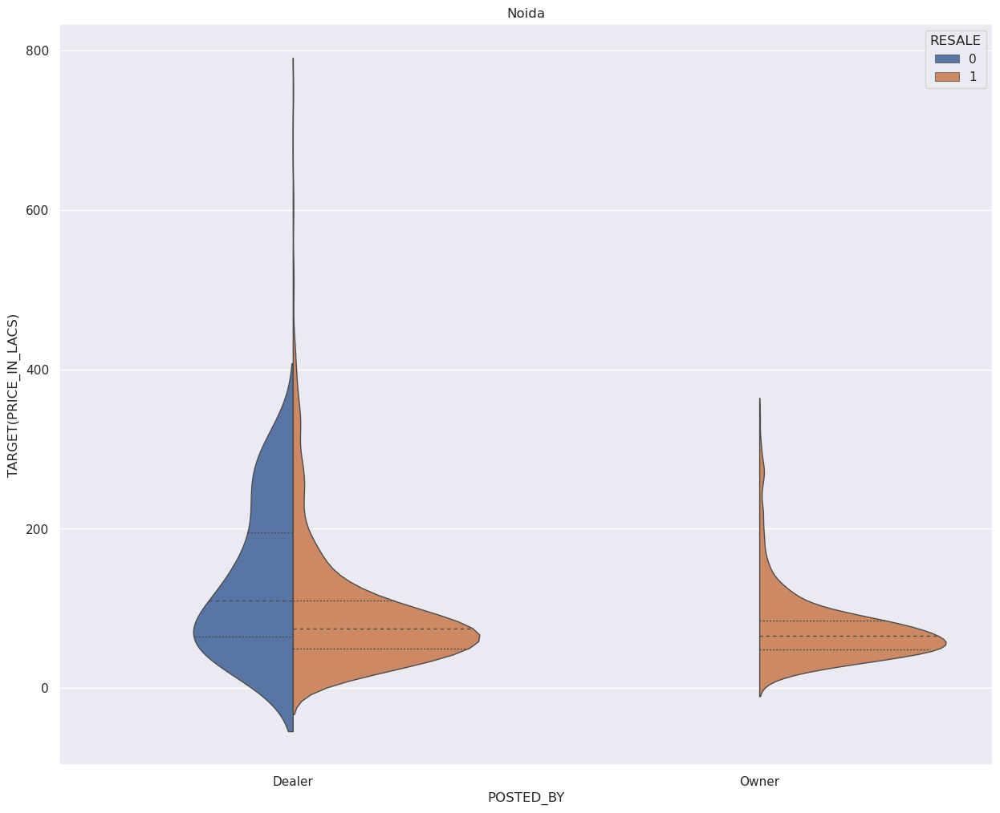

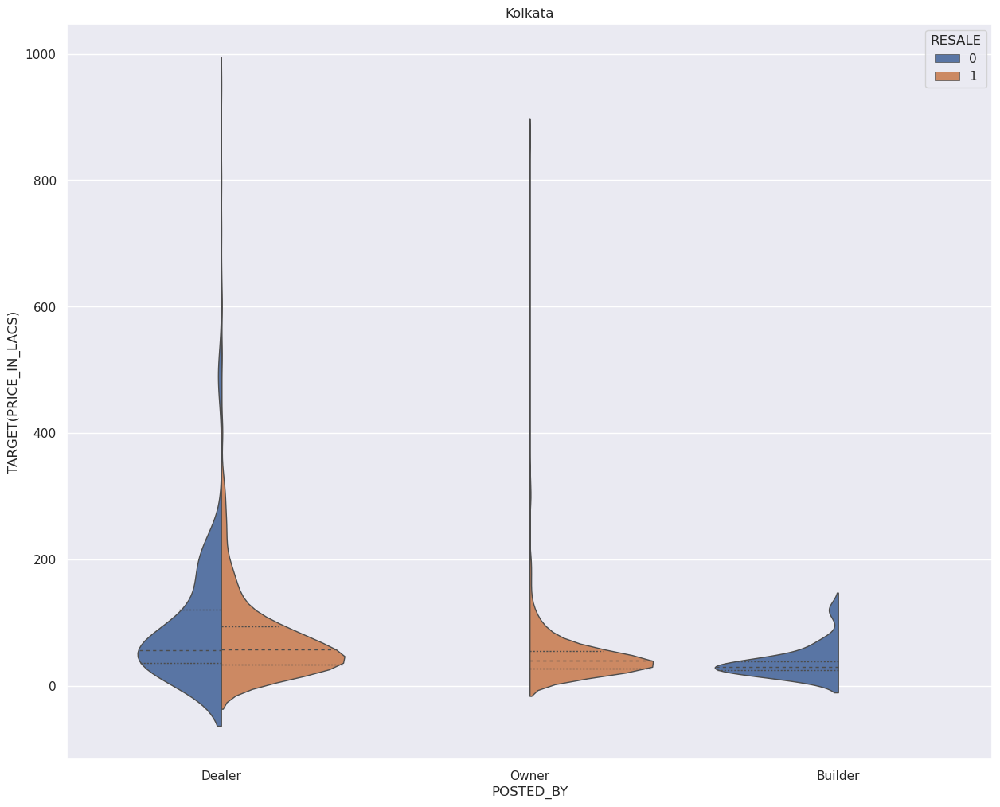

In [14]:
for city in major_cities:
    sb.violinplot(data=df.loc[df['City']==city], x="POSTED_BY", y="TARGET(PRICE_IN_LACS)", hue="RESALE" ,split=True, inner="quart", linewidth=1,title=city)
    plt.title(city)
    plt.show()

## Feature Engineering and Pre Processing of Data

In [15]:
pune = df.loc[df['City'] == 'Pune']
mumbai = df.loc[df['City'] == 'Mumbai']
bangalore = df.loc[df['City'] == 'Bangalore']

#"BHK_OR_RK" and "POSTED_BY" are categorical variables and hence they need to be converted into numeric
# and therefor we replace them with 0,1 and 0,1,2 respectively.
pune['BHK_OR_RK']=pune['BHK_OR_RK'].replace({'BHK':0,'RK':1})
pune['POSTED_BY']=pune['POSTED_BY'].replace({'Owner':0,'Dealer':1,'Builder':2})

# Dropping categorical variables "City" and "Locality" as we already have "Latitude" and "Longitudes" for them
pune.drop(['City'], inplace = True, axis = 1)
pune.drop(['Locality'], inplace = True, axis = 1)

# Dropping "Log_prices" and "Log_sq_ft" as they are of no use to us for performing Ml
pune.drop(['Log_prices'], inplace = True, axis = 1)
pune.drop(['log_sq_ft'], inplace = True, axis = 1)

# Dropping "Ready_to_Move" as it has a correlatoin coefficient of 1 with under construction.
pune.drop(['READY_TO_MOVE'], inplace = True, axis = 1)

# Displaying the dataset to check if all the above operations have been performed properly
display(pune)

# Doing the same thing for Mumbai
mumbai['BHK_OR_RK']=mumbai['BHK_OR_RK'].replace({'BHK':0,'RK':1})
mumbai['POSTED_BY']=mumbai['POSTED_BY'].replace({'Owner':0,'Dealer':1,'Builder':2})
mumbai.drop(['City'], inplace = True, axis = 1)
mumbai.drop(['Locality'], inplace = True, axis = 1)
mumbai.drop(['Log_prices'], inplace = True, axis = 1)
mumbai.drop(['log_sq_ft'], inplace = True, axis = 1)
mumbai.drop(['READY_TO_MOVE'], inplace = True, axis = 1)
display(mumbai)

# Doing the same thing for Bangalore
bangalore['BHK_OR_RK']=bangalore['BHK_OR_RK'].replace({'BHK':0,'RK':1})
bangalore['POSTED_BY']=bangalore['POSTED_BY'].replace({'Owner':0,'Dealer':1,'Builder':2})
bangalore.drop(['City'], inplace = True, axis = 1)
bangalore.drop(['Locality'], inplace = True, axis = 1)
bangalore.drop(['Log_prices'], inplace = True, axis = 1)
bangalore.drop(['log_sq_ft'], inplace = True, axis = 1)
bangalore.drop(['READY_TO_MOVE'], inplace = True, axis = 1)
display(bangalore)

/tmp/ipykernel_39260/405615610.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:12: SettingWithCopyWarning:


A value is 

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
28619,2,1,1,2,0,716.180371,0,18.602428,73.787111,56.7
14569,0,0,0,1,0,695.023631,1,18.691025,73.808100,25.0
18354,1,0,0,2,0,1208.106002,1,18.510861,73.926175,93.0
14698,1,0,1,2,0,1000.000000,1,18.599300,73.762500,70.0
13624,1,0,1,3,0,1300.156915,1,18.582300,73.983000,58.0
...,...,...,...,...,...,...,...,...,...,...
22675,1,0,0,2,0,960.988445,1,18.510861,73.926175,84.0
12103,1,0,0,3,0,1449.975834,1,18.511500,73.826300,210.0
1606,1,0,0,2,0,1050.126015,1,18.558319,73.775880,75.0
21,1,0,0,2,0,944.881890,1,18.452663,73.931040,42.0


/tmp/ipykernel_39260/405615610.py:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:28: SettingWithCopyWarning:


A value i

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
16154,1,1,1,3,0,879.548190,0,19.161500,72.873100,190.0
6799,1,1,1,2,0,649.201864,0,19.195500,72.872800,170.0
12909,1,0,0,2,0,929.080211,1,21.122092,79.045277,150.0
4449,1,0,0,2,0,866.666667,1,18.513060,76.875280,130.0
2140,1,0,1,1,0,660.045260,1,19.283359,72.864964,52.5
...,...,...,...,...,...,...,...,...,...,...
5897,1,1,0,3,0,1772.362227,1,19.058710,72.899690,320.0
7735,1,1,1,4,0,2250.027439,0,18.966670,72.833330,410.0
8553,1,0,0,2,0,1050.047729,1,19.049989,73.077321,77.0
9656,1,0,0,2,0,850.013710,1,18.960000,72.820000,31.0


/tmp/ipykernel_39260/405615610.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_39260/405615610.py:38: SettingWithCopyWarning:


A value i

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
15381,1,0,0,2,0,1214.936573,1,20.098413,79.107860,68.0
14076,1,0,0,2,0,1400.084854,1,12.969910,77.597960,99.0
11907,1,0,0,3,0,1674.914351,1,12.995893,77.761394,88.0
11902,1,0,0,3,0,1249.056604,1,12.969910,77.597960,66.2
11896,0,0,0,2,0,1152.141802,1,12.857176,77.592324,78.0
...,...,...,...,...,...,...,...,...,...,...
1116,0,0,0,1,0,525.059666,1,12.732961,77.707059,22.0
4134,1,0,0,2,0,1100.020371,1,12.928575,77.585721,54.0
830,0,0,0,1,0,645.977012,1,12.969910,77.597960,28.1
3533,0,0,0,4,0,2040.353661,1,13.031800,77.658300,90.0


## Splitting the data into training set and testing set

In [16]:
# We will use train_test_split function from sklearn to split the data into
# train set, validation set and test set
from sklearn.model_selection import train_test_split

train_p, test_p = train_test_split(pune, test_size=0.3)
train_m, test_m = train_test_split(mumbai, test_size=0.3)
train_b, test_b = train_test_split(bangalore, test_size=0.3)


# Printing length to verify that splitting has been done correctly
print(len(test_p))
print(len(train_p))
print(len(test_m))
print(len(train_m))
print(len(test_b))
print(len(train_b))

593
1383
1047
2441
1289
3007


## Normalisation and Creating Final Train and Test  Data

In [17]:
# Creating a list of continous_var for normalising the continous variables
# If a column has unique values greater then 10, it would be considered as continous variable
continous_var = ["TARGET(PRICE_IN_LACS)", "SQUARE_FT", "LATITUDE", "LONGITUDE"]

# We are using z_score normalisation
for col in continous_var:
    mean = np.mean(train_p[col])
    std = np.std(train_p[col])
    train_p[col] = (train_p[col]-mean)/std
    
    mean = np.mean(train_m[col])
    std = np.std(train_m[col])
    train_m[col] = (train_m[col]-mean)/std
    
    mean = np.mean(train_b[col])
    std = np.std(train_b[col])
    train_b[col] = (train_b[col]-mean)/std
    
for col in continous_var:
    mean = np.mean(test_p[col])
    std = np.std(test_p[col])
    test_p[col] = (test_p[col]-mean)/std
    
    mean = np.mean(test_m[col])
    std = np.std(test_m[col])
    test_m[col] = (test_m[col]-mean)/std
    
    mean = np.mean(test_b[col])
    std = np.std(test_b[col])
    test_b[col] = (test_b[col]-mean)/std
    

# Creating final training data and test data for Pune
y_train_p = train_p['TARGET(PRICE_IN_LACS)']
x_train_p = train_p.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

y_test_p = test_p['TARGET(PRICE_IN_LACS)']
x_test_p = test_p.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

# Creating final training data and test data fobr Mumbai
y_train_m = train_m['TARGET(PRICE_IN_LACS)']
x_train_m = train_m.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

y_test_m = test_m['TARGET(PRICE_IN_LACS)']
x_test_m = test_m.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

# Creating final training data and test data for Bangalore
y_train_b = train_b['TARGET(PRICE_IN_LACS)']
x_train_b = train_b.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

y_test_b = test_b['TARGET(PRICE_IN_LACS)']
x_test_b = test_b.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

## Multiple Linear Regression

In [23]:
# Importing necessary libraries for Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score


# Pune
print("Pune")

# Creating a object for linear multiple regression
model = LinearRegression()

# Fitting the training data into the model
model.fit(x_train_p,y_train_p)

# Displaying intercepts and coefficients of linear multiple regression
Intercept=model.intercept_
Coefficients=model.coef_
print("Intercept")
print(Intercept)
print("Coefficients")
print(Coefficients)

# Passing the test data into the model 
predictions = model.predict(x_test_p)

# Checking r2_score value 
print("Score value for Multiple Linear Regression is" ,r2_score(y_test_p, predictions))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_p, predictions))
print('mean_absolute_error : ', mean_absolute_error(y_test_p, predictions))
print('\n')

# All the above steps are done for Mumbai
print("Mumbai")
model.fit(x_train_m,y_train_m)
Intercept=model.intercept_
Coefficients=model.coef_
print("Intercept")
print(Intercept)
print("Coefficients")
print(Coefficients)
predictions = model.predict(x_test_m)
print("Score value for Multiple Linear Regression is" ,r2_score(y_test_m, predictions))
print('mean_squared_error : ', mean_squared_error(y_test_m, predictions))
print('mean_absolute_error : ', mean_absolute_error(y_test_m, predictions))
print('\n')

# All the above steps are done for Bangalore
print("Bangalore")
model.fit(x_train_b,y_train_b)
Intercept=model.intercept_
Coefficients=model.coef_
print("Intercept")
print(Intercept)
print("Coefficients")
print(Coefficients)
predictions = model.predict(x_test_b)
print("Score value for Multiple Linear Regression is" ,r2_score(y_test_b, predictions))
print('mean_squared_error : ', mean_squared_error(y_test_b, predictions))
print('mean_absolute_error : ', mean_absolute_error(y_test_b, predictions))


Pune
Intercept
0.42618380527338234
Coefficients
[ 3.59730387e-03  3.86712470e-02 -1.01444261e-01 -1.93529870e-02
  1.11022302e-16  9.18612956e-01 -3.68444940e-01  9.24724164e-02
  7.49431721e-02]
Score value for Multiple Linear Regression is 0.7247775329747237
mean_squared_error :  0.2752224670252763
mean_absolute_error :  0.27884290656936506


Mumbai
Intercept
-0.8836302417752525
Coefficients
[-2.79879876e-01 -2.34245468e-02  2.53060238e-02  5.39067593e-01
 -2.77555756e-16  3.11042570e-01  2.43859718e-02 -1.68641841e-02
 -8.05774608e-02]
Score value for Multiple Linear Regression is 0.485025165022816
mean_squared_error :  0.514974834977184
mean_absolute_error :  0.47639640163377484


Bangalore
Intercept
-0.6106593087568156
Coefficients
[1.16233437e-01 9.43141013e-02 9.52020940e-02 1.50502006e-01
 2.77555756e-17 7.07831971e-01 1.31179814e-01 5.91101142e-03
 7.19241478e-03]
Score value for Multiple Linear Regression is 0.6470075979557541
mean_squared_error :  0.3529924020442458
mean_abs

## Lasso Regression

In [24]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
import warnings

with warnings.catch_warnings(record=True):
    
    # Pune
    print("Pune")
    
    # Creating a object for Lasso regression
    model = linear_model.Lasso()
    
    # Making a list of values for hyperparameter alpha( or lambda)
    alpha_list = [x/10 for x in range(101)]
    search_space = {'alpha':alpha_list}
    
    # Using GridSearch to find the best estimate for hyperparameter alpha
    GS = GridSearchCV(model,search_space)
    
    # Fitting the training data into model
    GS.fit(x_train_p,y_train_p)
    
    # Passing the test data into the model 
    prediction = GS.predict(x_test_p)
    
    # Printing the best estimate of hyperparameter lambda
    print("Best estimate for lambda:", GS.best_estimator_)
    
    # Displaying intercepts and coefficients of linear multiple regression
    print("Coefficients")
    print(GS.best_estimator_.coef_)
    print("Intercept")
    print(GS.best_estimator_.intercept_)
    
    # Checking r2_score value 
    print("Score value for Lasso Regression on test Data:", GS.score(x_test_p,y_test_p))
    
    # Using MSE and MAE for calculating error
    print('mean_squared_error : ', mean_squared_error(y_test_p, prediction))
    print('mean_absolute_error : ', mean_absolute_error(y_test_p, prediction))
    print('\n')
    
    # All the above steps are done for Mumbai
    print("Mumbai")
    model = linear_model.Lasso()
    search_space = {'alpha':alpha_list}
    GS = GridSearchCV(model,search_space)
    GS.fit(x_train_m,y_train_m)
    prediction = GS.predict(x_test_m)
    print("Best estimate for lambda:", GS.best_estimator_)
    print("Coefficients")
    print(GS.best_estimator_.coef_)
    print("Intercept")
    print(GS.best_estimator_.intercept_)
    print("Score value for Lasso Regression on test Data:", GS.score(x_test_m,y_test_m))
    print('mean_squared_error : ', mean_squared_error(y_test_m, prediction))
    print('mean_absolute_error : ', mean_absolute_error(y_test_m, prediction))
    print('\n')
    
    
    # All the above steps are done for Bangalore
    print("Bangalore")
    model = linear_model.Lasso()
    search_space = {'alpha':alpha_list}
    GS = GridSearchCV(model,search_space)
    GS.fit(x_train_b,y_train_b)
    prediction = GS.predict(x_test_b)
    print("Best estimate for lambda:", GS.best_estimator_)
    print("Coefficients")
    print(GS.best_estimator_.coef_)
    print("Intercept")
    print(GS.best_estimator_.intercept_)
    print("Score value for Lasso Regression on test Data:", GS.score(x_test_b,y_test_b))
    print('mean_squared_error : ', mean_squared_error(y_test_b, prediction))
    print('mean_absolute_error : ', mean_absolute_error(y_test_b, prediction))


Pune
Best estimate for lambda: Lasso(alpha=0.0)
Coefficients
[ 0.0035973   0.03867125 -0.10144426 -0.01935299  0.          0.91861296
 -0.36844494  0.09247242  0.07494317]
Intercept
0.42618380527338035
Score value for Lasso Regression on test Data: 0.7247775329747237
mean_squared_error :  0.27522246702527636
mean_absolute_error :  0.2788429065693651


Mumbai
Best estimate for lambda: Lasso(alpha=0.1)
Coefficients
[-0.         -0.         -0.          0.42202716  0.          0.28783893
  0.          0.         -0.        ]
Intercept
-0.8929824900207816
Score value for Lasso Regression on test Data: 0.46904596791552056
mean_squared_error :  0.5309540320844794
mean_absolute_error :  0.466869026067417


Bangalore
Best estimate for lambda: Lasso(alpha=0.0)
Coefficients
[0.11623344 0.0943141  0.09520209 0.15050201 0.         0.70783197
 0.13117981 0.00591101 0.00719241]
Intercept
-0.6106593087568145
Score value for Lasso Regression on test Data: 0.6470075979557541
mean_squared_error :  0.352

## Ridge Regression

In [27]:
# Pune
print("Pune")

# Creating a object for Ridge regression
model = linear_model.Ridge()

# Making a list of values for hyperparameter alpha( or lambda)
alpha_list = [x/10 for x in range(101)]
search_space = {'alpha':alpha_list}

# Using GridSearch to find the best estimate for hyperparameter alpha
GS = GridSearchCV(model,search_space)

# Fitting the training data into model
GS.fit(x_train_p,y_train_p)

# Passing the test data into the model 
prediction = GS.predict(x_test_p)

# Printing the best estimate of hyperparameter lambda
print("Best estimate for lambda:", GS.best_estimator_)

# Displaying intercepts and coefficients of linear multiple regression
print("Coefficients")
print(GS.best_estimator_.coef_)
print("Intercept")
print(GS.best_estimator_.intercept_)

# Checking r2_score value 
print("Score value for Ridge Regression on test Data:", GS.score(x_test_p,y_test_p))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_p, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_p, prediction))
print('\n')

# All the above steps are done for Mumbai
print("Mumbai")
model = linear_model.Ridge()
search_space = {'alpha':alpha_list}
GS = GridSearchCV(model,search_space)
GS.fit(x_train_m,y_train_m)
prediction = GS.predict(x_test_m)
print("Best estimate for lambda:", GS.best_estimator_)
print("Coefficients")
print(GS.best_estimator_.coef_)
print("Intercept")
print(GS.best_estimator_.intercept_)
print("Score value for Ridge Regression on test Data:", GS.score(x_test_m,y_test_m))
print('mean_squared_error : ', mean_squared_error(y_test_m, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_m, prediction))
print('\n')


# All the above steps are done for Bangalore
print("Bangalore")
model = linear_model.Ridge()
search_space = {'alpha':alpha_list}
GS = GridSearchCV(model,search_space)
GS.fit(x_train_b,y_train_b)
prediction = GS.predict(x_test_b)
print("Best estimate for lambda:", GS.best_estimator_)
print("Coefficients")
print(GS.best_estimator_.coef_)
print("Intercept")
print(GS.best_estimator_.intercept_)
print("Score value for Ridge Regression on test Data:", GS.score(x_test_b,y_test_b))
print('mean_squared_error : ', mean_squared_error(y_test_b, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_b, prediction))

Pune
Best estimate for lambda: Ridge(alpha=1.2)
Coefficients
[ 0.00444042  0.03834861 -0.10043351 -0.01633028  0.          0.91553199
 -0.35768195  0.09214326  0.07467254]
Intercept
0.40840640193999533
Score value for Ridge Regression on test Data: 0.725420250023362
mean_squared_error :  0.2745797499766381
mean_absolute_error :  0.2786225104247063


Mumbai
Best estimate for lambda: Ridge(alpha=10.0)
Coefficients
[-0.2404679  -0.02390594  0.0246217   0.53537415  0.          0.31174078
  0.02866073 -0.01639933 -0.0800777 ]
Intercept
-0.9189002390524201
Score value for Ridge Regression on test Data: 0.4854467888746654
mean_squared_error :  0.5145532111253346
mean_absolute_error :  0.4756329579789035


Bangalore
Best estimate for lambda: Ridge(alpha=0.0)
Coefficients
[1.16233437e-01 9.56371852e-02 9.52532653e-02 1.52068093e-01
 1.58728257e+13 7.06668368e-01 1.32612097e-01 2.74995775e-03
 7.86110379e-03]
Intercept
-0.6161960766926415
Score value for Ridge Regression on test Data: 0.64689860

## Random Forest Regression

In [26]:
from sklearn.ensemble import RandomForestRegressor
  
# Pune
print("Pune")

# creating a regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
  
# fiting the regressor with x_train and y_train data
regressor.fit(x_train_p, y_train_p)  

# passing the test data into regressor
prediction = regressor.predict(x_test_p)

# There are no hyperparameters for RandomForest
print("Score value for Random Forest Regression on Test Data:",regressor.score(x_test_p,y_test_p))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_p, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_p, prediction))


# Mumbai
print("Mumbai")

# creating a regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
  
# fiting the regressor with x_train and y_train data
regressor.fit(x_train_m, y_train_m)  

# passing the test data into regressor
prediction = regressor.predict(x_test_m)

# There are no hyperparameters for RandomForest
print("Score value for Random Forest Regression on Test Data:",regressor.score(x_test_m,y_test_m))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_m, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_m, prediction))

  
# Bangalore
print("Bangalore")

# creating a regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
  
# fiting the regressor with x_train and y_train data
regressor.fit(x_train_b, y_train_b)  

# passing the test data into regressor
prediction = regressor.predict(x_test_b)

# There are no hyperparameters for RandomForest
print("Score value for Random Forest Regression on Test Data:",regressor.score(x_test_b,y_test_b))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_b, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_b, prediction))

Pune
Score value for Random Forest Regression on Test Data: 0.6583442812182068
mean_squared_error :  0.3416557187817932
mean_absolute_error :  0.271948817634132
Mumbai
Score value for Random Forest Regression on Test Data: 0.31797082603160765
mean_squared_error :  0.6820291739683924
mean_absolute_error :  0.505055047946718
Bangalore
Score value for Random Forest Regression on Test Data: 0.7172123044938331
mean_squared_error :  0.2827876955061669
mean_absolute_error :  0.29456710901118377


## Conclusions
### 1). The best model for predicting house prices in Pune is Ridge Regression model as it has very high value of r2 score value compared to other models
### 2).The best model for predicting house prices in Mumbai is Ridge Regression model as it has very high value of r2 score value compared to other models
### 3).The best model for predicting house prices in Bangalore is Random Forest Regression model as it has very high value of r2 score value compared to other models